# **Data Mining 2022 Assignment**

- Kaggle Name: Koray Saliah
- Number of Kaggle Submissions: 35
- Public Leaderboard Score: 1.58841
- Private Leaderboard Score: 2.00440

## **Business Understanding**

The stand-out objective of the project is to produce a predictive model that can accurately return the taxi fares for all possible journeys and new trips in the local Bournemouth and Dorset region. The requirement for the model is its accuracy in predicting a fare as close to the actual price as possible. The need for this precision is indisputable as it could deter possible customers if the algorithm overcharges customers for journeys. Currently, the data provided is raw and little correlation can be observed between the attributes, hence the need for a model with useable features to provide a level of intelligence to the predictive algorithm. 10,000 journeys were observed within two weeks, shown in the dataset, highlighting the necessity for an automated system; as it would be near impossible to predict new taxi journeys manually.  This project will be completed in accordance with the CRISP-DM methodology.

 

## Data Understanding

Within this section, charts have been created and other data analysis tools used, to better visualise the correlation within the raw data, to help understand how the model can be trained to have a higher accuracy when predicting the label. The importance of finding these correlations in data mean that redundant data can be ignored, to a certain extent, while more specific helpful information can be picked up and used.

### Imports for our module code

A variety of important libraries and appropriate modules are imported in order for the code to execute with the outcome desired.

In [1]:
!mkdir -p /root/.kaggle
!echo '{"username":"koraysaliah","key":"0bcc8ac5d65870e5b9dfe9443e752c39"}'> /root/.kaggle/kaggle.json
!chmod 600 /root/.kaggle/kaggle.json

In [2]:
import kaggle
!kaggle competitions download -c budm22 --force
!unzip -o budm22.zip

  0% 0.00/662k [00:00<?, ?B/s]
100% 662k/662k [00:00<00:00, 60.4MB/s]
Archive:  budm22.zip
  inflating: sample_submission.csv   
  inflating: test.csv                
  inflating: train.csv               


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from copy import deepcopy
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error 
from math import sqrt
import math
from sklearn import metrics
import geopy
from geopy.geocoders import Nominatim
import os
import re
from functools import lru_cache

### Importing our training csv file

Here, the dataset variable is assigned to the imported train.csv file in order to begin training the models to find the best model fit.

In [4]:
dataset = pd.read_csv ("train.csv")

### Preprocessing

Preprocessing is the activity of preparing data to make it viable to use for processing. This may include, but not limited to, the resolution and handling of missing values. Preprocessing is an important step in the build of the model to ensure better accuracy.

In [5]:
dataset.head()

,start_time,start_lat,start_lon,orig_addr,end_time,end_lat,end_lon,dest_addr,passengers,booster_seat,large_luggage,fare
0,2019-09-10 09:14:54,50.769459,-1.903250,"Home Road, Bournemouth BH11 9AP, UK",2019-09-10 09:28:49,50.725836,-1.915326,"Tesco, Poole BH12 1AW, UK",2,False,False,13.3
1,2019-09-19 19:44:00,50.723060,-1.952773,"Ashley Cross, Poole BH14 0JT, UK",2019-09-19 19:51:43,50.726338,-1.902291,"Ipswich Road, Bournemouth BH4 9FW, UK",3,False,True,12.6
2,2019-09-09 09:54:27,50.768005,-1.933542,"King John Avenue, Bournemouth BH11 9TG, UK",2019-09-09 10:12:31,50.717674,-1.870154,"Russell Cotes Museum, Bournemouth BH1 3AD, UK",1,False,False,18.9
3,2019-09-09 12:04:53,50.730139,-1.870998,"Milton Road, Bournemouth BH1 1RW, UK",2019-09-09 12:24:10,50.786435,-1.964853,"Chichester Walk, Oakley, Wimborne BH21 1SR, UK",2,False,False,21.8
4,2019-09-21 13:59:51,50.722013,-1.903093,"Post Office, Bournemouth BH4 9AR, UK",2019-09-21 14:11:58,50.738312,-1.822184,"Petersfield Place, Bournemouth BH7 6QW, UK",1,False,False,15.2


In [6]:
dataset.describe()

,start_lat,start_lon,end_lat,end_lon,passengers,fare
count,9864.000000,9864.000000,9870.000000,9870.000000,10000.000000,10000.000000
mean,50.742004,-1.874138,50.742068,-1.873999,1.797000,22.005650
std,0.019073,0.073194,0.019244,0.073561,1.038797,12.035628
min,50.684435,-2.011842,50.684435,-2.011842,1.000000,3.400000
25%,50.727698,-1.918883,50.727568,-1.919821,1.000000,13.400000
50%,50.740843,-1.883817,50.740491,-1.884817,1.000000,19.500000
75%,50.753333,-1.834757,50.753216,-1.835939,2.000000,28.100000
max,50.800756,-1.644823,50.800756,-1.644823,6.000000,130.900000


In [7]:
dataset.isnull().sum()

start_time         0
start_lat        136
start_lon        136
orig_addr          0
end_time           0
end_lat          130
end_lon          130
dest_addr          0
passengers         0
booster_seat       0
large_luggage      0
fare               0
dtype: int64

### Handling of missing values

#### Seperation for a postcode column

Here the postcode has been extracted from the appropriate address columns. During the build of the model, it was found that Geopy excelled in accuracy when just the postcode was used and produced no null values. Whereas, using the whole address did produce empty values when retrieving the longitude and latitude.

In [8]:
def postcode(address):
    postcode_find = re.search(r'BH\d{1,2} ...', address)
    if postcode_find:
        return postcode_find.group(0)
    else:
        return 'BH2 5NS'

In [9]:
dataset['orig_postcode'] = dataset.apply(lambda dataset: postcode(dataset['orig_addr']), axis = 1)
dataset['dest_postcode'] = dataset.apply(lambda dataset: postcode(dataset['dest_addr']), axis = 1)

#### Input of missing longitude and latitude values
##### Creation of the longitude and latitude filling functions using Geopy

Two functions were used to fill the latitude and longitude of the separate origin and destination addresses.

In [10]:
@lru_cache()
def fill_coord_lat(postcode):
        geolocator = Nominatim(timeout=10, user_agent="coord")
        valid_addr = geolocator.geocode(postcode)

        if valid_addr is None:
            return (50.718395, -1.883377) # Average latitude and longitude of Bournemouth.

        else:
            return (valid_addr.latitude, valid_addr.longitude)

In [11]:
@lru_cache()
def fill_coord_lon(postcode):
        geolocator = Nominatim(timeout=10, user_agent="coord")
        valid_addr = geolocator.geocode(postcode)

        if valid_addr is None:
            return (-1.883377, 50.718395) # Average longitude and latitude of Bournemouth.

        else:
            return (valid_addr.longitude, valid_addr.latitude)

In [12]:
dataset['start_lat'] = dataset.apply(lambda dataset: fill_coord_lat(dataset['orig_postcode'])[0] 
                                     if pd.isnull(dataset['start_lat']) 
                                     else dataset['start_lat'], axis = 1)

dataset['start_lon'] = dataset.apply(lambda dataset: fill_coord_lon(dataset['orig_postcode'])[0] 
                                     if pd.isnull(dataset['start_lon']) 
                                     else dataset['start_lon'], axis = 1)

In [13]:
dataset['end_lat'] = dataset.apply(lambda dataset: fill_coord_lat(dataset['dest_postcode'])[0] 
                                   if pd.isnull(dataset['end_lat']) 
                                   else dataset['end_lat'], axis = 1)

dataset['end_lon'] = dataset.apply(lambda dataset: fill_coord_lon(dataset['dest_postcode'])[0] 
                                   if pd.isnull(dataset['end_lon']) 
                                   else dataset['end_lon'], axis = 1)

In [14]:
dataset.isnull().sum()

start_time       0
start_lat        0
start_lon        0
orig_addr        0
end_time         0
end_lat          0
end_lon          0
dest_addr        0
passengers       0
booster_seat     0
large_luggage    0
fare             0
orig_postcode    0
dest_postcode    0
dtype: int64

In [15]:
train_dataset = dataset.drop(['orig_addr', 'dest_addr', 'orig_postcode', 'dest_postcode'],axis=1)

### Creation of meaningful attributes

The creation of two new columns, distance and duration, explore the correlation in the data with more meaning. Without these two attributes being created low correlation between attributes can be observed, in the heatmap below, in turn making our data understanding limited and redundant.

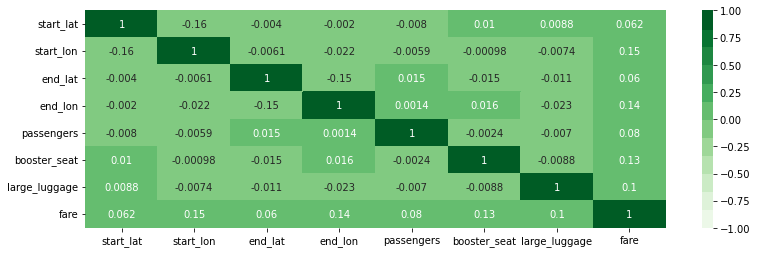

In [16]:
plt.figure(figsize=[13,4])
colormap = sns.color_palette("Greens", 12)
sns.heatmap(train_dataset.corr(), annot=True, vmin=-1, vmax=1, center=0, cmap=colormap)
plt.show();
pass

In [17]:
# Setting the Boolean values to Float as representing 1 and 0 for True and False.
# Good practice keeping the same type throughout.

train_dataset.booster_seat = train_dataset.booster_seat.replace({True: 1, False: 0}).astype(float)
train_dataset.large_luggage = train_dataset.large_luggage.replace({True: 1, False: 0}).astype(float)
train_dataset.passengers = train_dataset.passengers.astype(float)

#### Creation of a duration attribute using datetime

'start_time' and 'end_time' values were changed from a string value to datetime to allow for the creation of a duration variable.

In [18]:
train_dataset['start_time'] = pd.to_datetime(train_dataset['start_time'],format='%Y-%m-%d %H:%M:%S')
train_dataset['end_time'] = pd.to_datetime(train_dataset['end_time'],format='%Y-%m-%d %H:%M:%S')

**Checking of our new data type**

Checking the attribute has successfully changed data type.

In [19]:
type(train_dataset['start_time'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [20]:
train_dataset['start_time'][0]

Timestamp('2019-09-10 09:14:54')

In [21]:
train_dataset['duration'] = (train_dataset['end_time'] - train_dataset['start_time']).dt.total_seconds() /60

# Rounded to match the hold out test set format
train_dataset['duration'] = np.round(train_dataset['duration'])

#### Google Distance API Calculation

Google Maps API distance matrix was used to calculate the final Kaggle board submission. Google Maps API works better as it uses the roads as the true distance. However, in order to prevent confusion with API keys it has been commented out and the haversine calculation will be used as a form of replacement for distance.

In [22]:
# train_dataset["start_lat"] = train_dataset["start_lat"].astype(str)
# train_dataset["start_lon"] = train_dataset["start_lon"].astype(str)
# train_dataset["origins"] = train_dataset["start_lat"] + "," + train_dataset["start_lon"]

In [23]:
# train_dataset["end_lat"] = train_dataset["end_lat"].astype(str)
# train_dataset["end_lon"] = train_dataset["end_lon"].astype(str)
# train_dataset["destinations"] = train_dataset["end_lat"] + "," + train_dataset["end_lon"]

In order to use the google maps function for distance, a creation of an API key will be made externally and inserted where API_KEY is defined. Removing all of the comments will need to be done before being used as well. 

In [24]:
# !pip install googlemaps
# import googlemaps

# # Insert your API key here
# API_key = 'INSERT API KEY HERE.'
# gmaps = googlemaps.Client(key=API_key)

# def get_distances(instances):
#     distance_matrix = gmaps.distance_matrix(instances['origins'], instances['destinations'], mode='driving')
#     status = distance_matrix['rows'][0]['elements'][0]['status']
    
#     if status == "OK":
#         length = int(distance_matrix['rows'][0]['elements'][0]['distance']['value'] / 1000)
#     else:
#         length = 0
#     return length

In [25]:
# train_dataset["google_distance"] = train_dataset.apply(get_distances, axis=1)

In [26]:
# train_dataset["google_distance"] = train_dataset["google_distance"].astype(float)

In [27]:
# train_dataset = train_dataset.drop(['origins', 'destinations'], axis=1)

#### Haversine formula used for the creation of distance attribute

Haversine was used as the formula for distance as it takes the distance of two points on a sphere using the longitude and latitude. Since the dataset has the values in miles, earth's radius is set to 3959 miles instead of 6378 kilometres.

In [28]:
def haversine_distance(end_lat, end_lon, start_lat, start_lon, conv_radians=True, radius=3959.87433):
    
    if conv_radians:
        end_lat, end_lon, start_lat, start_lon = np.radians([end_lat, end_lon, start_lat, start_lon])
    calc1 = np.sin((start_lat-end_lat)/2.0)**2 
    calc2 = calc1 + np.cos(end_lat) * np.cos(start_lat) * np.sin((start_lon-end_lon)/2.0)**2
    haversine_distance = radius * 2 * np.arcsin(np.sqrt(calc2))
    
    return haversine_distance

In [29]:
# Assigning haversine distance to every row in the dataset

haversine_dist = train_dataset.apply(lambda row : haversine_distance(row['end_lat'], 
                                                                     row['end_lon'], 
                                                                     row['start_lat'], 
                                                                     row['start_lon']), axis = 1)
train_dataset['haversine_dist'] = haversine_dist

# Viewing the first 10 values of the new distance column.
haversine_dist[:10]

0    3.060796
1    2.220280
2    4.448098
3    5.654726
4    3.714399
5    4.751739
6    3.436723
7    2.216298
8    9.884448
9    5.476889
dtype: float64

### Exploratory Data Analysis

**Heatmap to show the ranking of correlated attributes**

Observing, the most correlated attributes are the newly extracted features of distance and duration in relation to the fare.

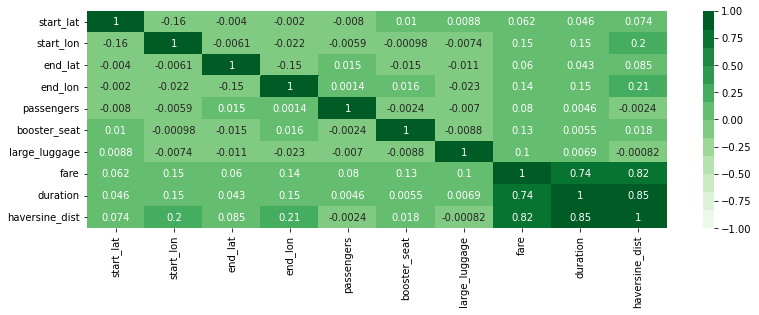

In [30]:
plt.figure(figsize=[13,4])
colormap = sns.color_palette("Greens", 12)
sns.heatmap(train_dataset.corr(), annot=True, vmin=-1, vmax=1, center=0, cmap=colormap)
plt.show();
pass

**Fare and Passengers**

A distinct increase in fare price was observed when the passengers are above 3 people. An increase in outliers and varying fare prices was also observed once passengers is at 4 or above.

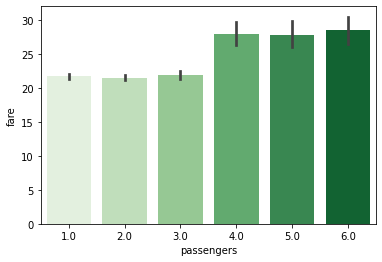

In [31]:
sns.barplot(x="passengers", y="fare", data=train_dataset, palette="Greens");pass

**Booster Seat and Fare**

Another observation to be recorded is the definite positive correlation between the use of a booster seat and an increase in fare.

*Key:*
- 1.0 = True
- 0.0 = False

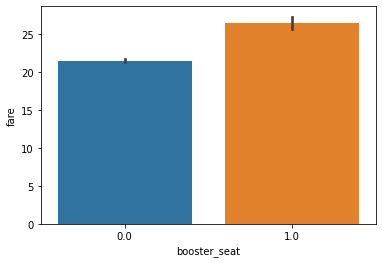

In [32]:
sns.barplot(x="booster_seat", y="fare", data=train_dataset);pass

**Busiest Hours of the day**

Here it is made apparent that the most requested time for a taxi trip is around 4pm, 5pm, 9am and 8am.

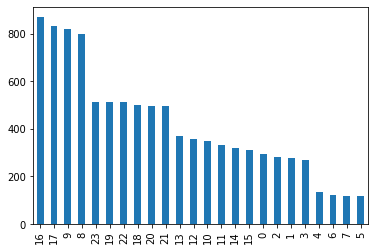

In [33]:
train_dataset['start_time'].dt.hour.value_counts().plot(kind = "bar");pass

**Busiest days of the week**

Here the most requested days for taxis appear to be Saturday and Friday.

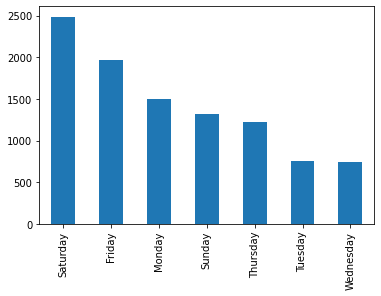

In [34]:
train_dataset['start_time'].dt.day_name().value_counts().plot(kind = "bar");pass

In [35]:
train_dataset['start_time'].dt.day_name().value_counts()

Saturday     2487
Friday       1969
Monday       1505
Sunday       1316
Thursday     1222
Tuesday       754
Wednesday     747
Name: start_time, dtype: int64

**Day with the highest expense**

A clear understanding can be made that Saturdays are the most expensive days for taxi journeys on average whereas the rest of the week remain similar.

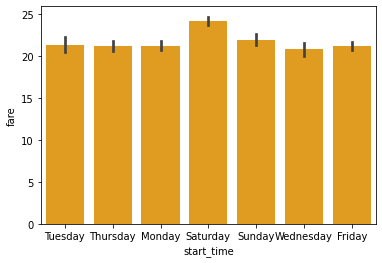

In [36]:
sns.barplot(data=train_dataset, x=train_dataset['start_time'].dt.day_name(), y="fare", color='orange');pass

**Relationship between the fare and the duration or distance**

Through this graph a change in the fare is seen even when the duration of the journey is the same, providing a possible angle to explore.

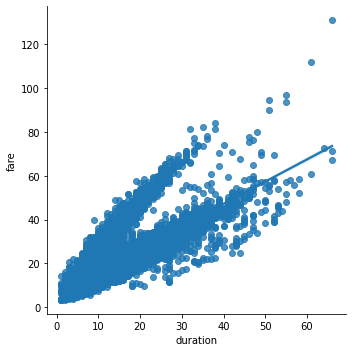

In [37]:
sns.lmplot(x="duration", y="fare", data=train_dataset);pass

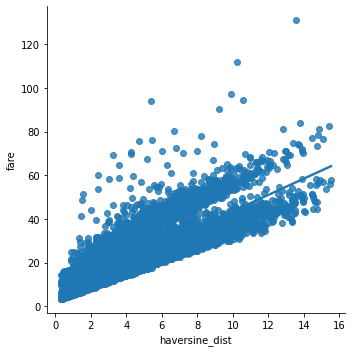

In [38]:
sns.lmplot(x="haversine_dist", y="fare", data=train_dataset);pass

**Fare Visualisation**

Here it is seen that a high number of journeys are around the same fare price, which gives an indication of the most common length of journeys.

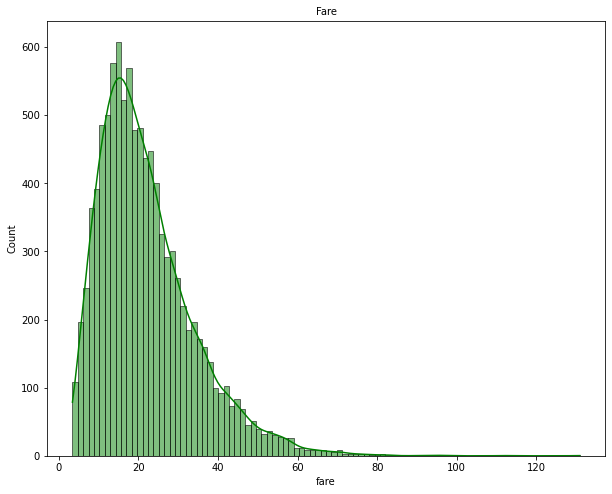

In [39]:
plt.figure(figsize=(10,8))
sns.histplot(data=train_dataset, x="fare", kde=True, color="green")
plt.title("Fare", fontsize=10)
plt.show()

**End address location and durations**

In [40]:
import folium
# Duration and location of the destination people have travelled to

lat_m = np.mean([max(train_dataset['start_lat']), min(train_dataset['end_lat'])])
lon_m = np.mean([max(train_dataset['start_lon']), min(train_dataset['end_lon'])])
folium_map = folium.Map(location=[lat_m, lon_m], zoom_start=10, tiles="CartoDB dark_matter")

for i in range(0,len(train_dataset)):
    folium.CircleMarker(location=[train_dataset.iloc[i]['end_lat'], train_dataset.iloc[i]['end_lon']], 
                        popup=('Duration:', train_dataset.iloc[i]['duration']),
                        radius=5,
                        color='#3186cc',
                        fill=True,
                        fill_color='#3186cc').add_to(folium_map) 
folium_map

### Handling Outliers

In [41]:
import plotly.express as px
# Outliers spotted above 90.2 fare as these are only seen a handful of times

fig = px.box(train_dataset, y='fare', width=800, height=400)
fig.show()

In [42]:
# Duration outliers that could throw off the RMSE score

fig = px.box(train_dataset, y='duration', width=800, height=400)
fig.show()

In [43]:
# Number of counts through each fare, again highlighting outliers

fig = px.histogram(train_dataset, x='fare', width=800, height=400)
fig.show()

In [44]:
# Outliers out of the majority plot

fig = px.scatter(train_dataset, y="fare", width=800, height=400)
fig.show()

In [45]:
average_fare = train_dataset['fare'].mean()

In [46]:
print(average_fare)

22.00565


In [47]:
def outliers_IQR(dataset_column):
   Q1=dataset_column.quantile(0.10)
   Q3=dataset_column.quantile(0.90)
   IQR=Q3-Q1
   outliers = dataset_column[((dataset_column<(Q1-1.5*IQR)) | (dataset_column>(Q3+1.5*IQR)))]
   return outliers

In [48]:
outliers = outliers_IQR(train_dataset['fare'])

# Seeing the values of our outliers from the range set in our function
print("Maximum outlier value: ", outliers.max())
print("Minimum outlier value: ", outliers.min())
print("Number count of outliers: "+ str(len(outliers)))
print("Sum of outliers count: ", np.sum(outliers))

Maximum outlier value:  130.9
Minimum outlier value:  81.4
Number count of outliers: 9
Sum of outliers count:  865.8


In [49]:
outlier_attribute = ['fare']

Q1 = train_dataset[outlier_attribute].quantile(0.10)
Q3 = train_dataset[outlier_attribute].quantile(0.90)
IQR = Q3 - Q1

# Dropping of the outliers in the quantile range set above
train_dataset = train_dataset[~((train_dataset[outlier_attribute] < (Q1 - 1.5 * IQR)) |(train_dataset[outlier_attribute] > (Q3 + 1.5 * IQR))).any(axis=1)]

In [50]:
train_dataset.shape

(9991, 12)

In [51]:
train_dataset.reset_index()

,index,start_time,start_lat,start_lon,end_time,end_lat,end_lon,passengers,booster_seat,large_luggage,fare,duration,haversine_dist
0,0,2019-09-10 09:14:54,50.769459,-1.903250,2019-09-10 09:28:49,50.725836,-1.915326,2.0,0.0,0.0,13.3,14.0,3.060796
1,1,2019-09-19 19:44:00,50.723060,-1.952773,2019-09-19 19:51:43,50.726338,-1.902291,3.0,0.0,1.0,12.6,8.0,2.220280
2,2,2019-09-09 09:54:27,50.768005,-1.933542,2019-09-09 10:12:31,50.717674,-1.870154,1.0,0.0,0.0,18.9,18.0,4.448098
3,3,2019-09-09 12:04:53,50.730139,-1.870998,2019-09-09 12:24:10,50.786435,-1.964853,2.0,0.0,0.0,21.8,19.0,5.654726
4,4,2019-09-21 13:59:51,50.722013,-1.903093,2019-09-21 14:11:58,50.738312,-1.822184,1.0,0.0,0.0,15.2,12.0,3.714399
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9986,9995,2019-09-10 23:20:27,50.721124,-1.894269,2019-09-10 23:22:02,50.722312,-1.904934,1.0,0.0,0.0,7.0,2.0,0.473784
9987,9996,2019-09-12 08:04:30,50.719330,-1.880250,2019-09-12 08:33:34,50.751837,-1.679218,1.0,0.0,1.0,36.1,29.0,9.075902
9988,9997,2019-09-21 23:03:15,50.722054,-1.795103,2019-09-21 23:12:54,50.724600,-1.863859,1.0,0.0,0.0,21.8,10.0,3.013419
9989,9998,2019-09-14 13:22:40,50.771315,-1.887236,2019-09-14 13:33:11,50.783332,-1.963011,2.0,0.0,0.0,12.8,11.0,3.414120


## Data Preparation and Modelling

In terms of preprocessing this project was started by cleaning the dataset before any changes could be made; in order to ensure the data being worked with is as accurate and viable as possible. To make certain that the datatypes of the attributes remain the same throughout, the conversion of all values to floats have be made. In addition, the dataset now also has no null values. 

Here the creation of multiple features will be extrapolated from the raw data, trying to convert it to more meaningful information. The feature engineering will be geared towards the improvement of the models, to see what works best.

Error Analysis will also be performed to corroborate the validity of the data with no extreme outliers or performance reducing instances.

### Feature Engineering

#### Assigning trips to weekends and weekdays

As seen in the Exploratory Data Analysis Weekends seemed to appear the busiest days of the week, hence the creation of this feature.

A variety of combinations were trialled when defining the weekend. It was found that the model worked better when the weekend was fitted to just Saturday and Sunday.

In [52]:
def day_of_trip(trip_day):
    if trip_day in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']:
        return 'Weekday'
    else:
        return 'Weekend'

In [53]:
train_dataset['weekend_trip'] = train_dataset.apply(lambda train_dataset: day_of_trip(train_dataset['start_time'].day_name()), axis = 1)

#### Assigning trips to days and nights

Using the previous discovery of increased fares at weekends, this was applied to a night time and day time trip as well. The cost of a fare usually increases on a night time tariff.

In [54]:
def time_of_trip(trip_time):
    if 6 < trip_time < 22:
        return 'Day Tarriff'
    else:
        return 'Night Tarriff'

In [55]:
train_dataset['night_trips'] = train_dataset.apply(lambda train_dataset: time_of_trip(train_dataset['start_time'].hour), axis = 1)

**Changing the data type of our data**

The model seemed to take data on better when using the same datatype, specifically float. Below is the change in type of weekend trips along with night trips to float, which is better suited to the models. Consequently, this change will be made to all newly assigned features.

In [56]:
train_dataset.weekend_trip = train_dataset.weekend_trip.replace({"Weekend": 1, "Weekday": 0}).astype(float)
train_dataset.night_trips = train_dataset.night_trips.replace({"Night Tarriff": 1, "Day Tarriff": 0}).astype(float)

In [57]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9991 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   start_time      9991 non-null   datetime64[ns]
 1   start_lat       9991 non-null   float64       
 2   start_lon       9991 non-null   float64       
 3   end_time        9991 non-null   datetime64[ns]
 4   end_lat         9991 non-null   float64       
 5   end_lon         9991 non-null   float64       
 6   passengers      9991 non-null   float64       
 7   booster_seat    9991 non-null   float64       
 8   large_luggage   9991 non-null   float64       
 9   fare            9991 non-null   float64       
 10  duration        9991 non-null   float64       
 11  haversine_dist  9991 non-null   float64       
 12  weekend_trip    9991 non-null   float64       
 13  night_trips     9991 non-null   float64       
dtypes: datetime64[ns](2), float64(12)
memory usage: 1.1 MB


#### Assigning a busiest days attribute

It was found that this attribute of busiest days became redundant and did not add to the model significantly hence the removal of this feature later on.

In [58]:
def busiest_days(day):
    if day in ['Tuesday', 'Wednesday', 'Thursday', 'Sunday']:
        return 'Slower Day'
    else:
        return 'Busy Day'

In [59]:
train_dataset['busy_days'] = train_dataset.apply(lambda train_dataset: busiest_days(train_dataset['start_time'].day_name()), axis = 1)
train_dataset.busy_days = train_dataset.busy_days.replace({"Busy Day": 1, "Slower Day": 0}).astype(float)

#### Assigning a larger vehicle for more passengers

Logically with more passengers comes the need for a larger vehicle which will impact the fare. It was decided through the visualisations that assigning a vehicle with a number of passengers larger than 4 as a 'Larger Vehicle' would work best for the model.

In [60]:
highest_passenger_num = train_dataset['passengers'].max()
print(highest_passenger_num)

6.0


In [61]:
def larger_car_trip (num_passengers):
    if num_passengers > 3:
        return "Larger Vehicle"
    else: 
        return "Basic Vehicle"

In [62]:
train_dataset['larger_vehicle'] = train_dataset.apply(lambda train_dataset: larger_car_trip(train_dataset['passengers']), axis = 1)
train_dataset.larger_vehicle = train_dataset.larger_vehicle.replace({"Larger Vehicle": 1, "Basic Vehicle": 0}).astype(float)

#### Addition of holidays attribute

With the addition of the holidays package, the model is able to identify national holidays that may affect the fare. However, the dataset only ranged over a two-week window in September meaning holidays become unessential and in turn was removed later on.

In [63]:
import holidays

In [64]:
earliest_date = train_dataset['start_time'].min()
latest_date = train_dataset['end_time'].max()

print(earliest_date)
print(latest_date)

2019-09-09 00:26:23
2019-09-23 00:14:12


In [65]:
uk_holidays = []
for holiday_date in holidays.UnitedKingdom(years=2019).items():
    uk_holidays.append(str(holiday_date[0]))
    print(str(holiday_date[0]))

2019-01-01
2019-01-02
2019-03-17
2019-03-18
2019-07-12
2019-08-05
2019-11-30
2019-12-25
2019-04-19
2019-04-22
2019-05-06
2019-05-27
2019-08-26
2019-12-26


In [66]:
str(train_dataset['start_time'][0]).split()[0]

'2019-09-10'

In [67]:
train_dataset['holiday_dates'] = [1 if str(val).split()[0] in uk_holidays else 0 for val in train_dataset['start_time']]
train_dataset.holiday_dates = train_dataset.holiday_dates.astype(float)

#### Addition of a rush hour timeframe

Adding a rush hour column trained the model to see the difference in the time spent in a taxi at recurring points during the day. Even with distances of a similar length, at these times, the fare increased.

In [68]:
def rush_hour_times(trip_time):
    if trip_time == 9:
        return 'Rush Hour'
    elif trip_time == 8:
        return 'Rush Hour'
    elif trip_time == 16:
        return 'Rush Hour'
    elif trip_time == 17:
        return 'Rush Hour'
    else:
        return 'Normal'

In [69]:
train_dataset['rush_hour'] = train_dataset.apply(lambda train_dataset: rush_hour_times(train_dataset['start_time'].hour), axis = 1)
train_dataset.rush_hour = train_dataset.rush_hour.replace({"Rush Hour": 1, "Normal": 0}).astype(float)

#### Dropping the redundant attributes

To finalise the training of the dataset, the values that are now no longer useful to the model or have been used are now redundant and removed. 

In [70]:
train_dataset = train_dataset.drop(['start_time', 'start_lat', 'start_lon', 'end_time', 'end_lat', 'end_lon'], axis=1)
train_dataset.head()

,passengers,booster_seat,large_luggage,fare,duration,haversine_dist,weekend_trip,night_trips,busy_days,larger_vehicle,holiday_dates,rush_hour
0,2.0,0.0,0.0,13.3,14.0,3.060796,0.0,0.0,0.0,0.0,0.0,1.0
1,3.0,0.0,1.0,12.6,8.0,2.220280,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,18.9,18.0,4.448098,0.0,0.0,1.0,0.0,0.0,1.0
3,2.0,0.0,0.0,21.8,19.0,5.654726,0.0,0.0,1.0,0.0,0.0,0.0
4,1.0,0.0,0.0,15.2,12.0,3.714399,1.0,0.0,1.0,0.0,0.0,0.0


#### Understanding the dataset information

In [71]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9991 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   passengers      9991 non-null   float64
 1   booster_seat    9991 non-null   float64
 2   large_luggage   9991 non-null   float64
 3   fare            9991 non-null   float64
 4   duration        9991 non-null   float64
 5   haversine_dist  9991 non-null   float64
 6   weekend_trip    9991 non-null   float64
 7   night_trips     9991 non-null   float64
 8   busy_days       9991 non-null   float64
 9   larger_vehicle  9991 non-null   float64
 10  holiday_dates   9991 non-null   float64
 11  rush_hour       9991 non-null   float64
dtypes: float64(12)
memory usage: 1.2 MB


#### Error Analysis

Error analysis is pivotal in recognising inaccurate data that could affect the models negatively, due to the incongruous nature of this type of data.

In [72]:
# Checking the number and cost of journyes 1 minute long.

train_dataset.query('duration < 2')

,passengers,booster_seat,large_luggage,fare,duration,haversine_dist,weekend_trip,night_trips,busy_days,larger_vehicle,holiday_dates,rush_hour
37,1.0,0.0,0.0,3.5,1.0,0.328597,0.0,0.0,1.0,0.0,0.0,1.0
188,1.0,0.0,1.0,10.0,1.0,0.462528,1.0,1.0,1.0,0.0,0.0,0.0
1338,2.0,0.0,0.0,3.5,1.0,0.377309,0.0,0.0,1.0,0.0,0.0,0.0
1453,2.0,0.0,1.0,10.1,1.0,0.434108,1.0,1.0,0.0,0.0,0.0,0.0
1564,2.0,0.0,0.0,6.3,1.0,0.339220,1.0,1.0,0.0,0.0,0.0,0.0
1913,1.0,0.0,0.0,3.7,1.0,0.324556,0.0,0.0,0.0,0.0,0.0,0.0
1995,3.0,0.0,0.0,6.9,1.0,0.435697,1.0,1.0,0.0,0.0,0.0,0.0
3450,1.0,0.0,0.0,3.5,1.0,0.370293,1.0,0.0,1.0,0.0,0.0,0.0
3594,1.0,0.0,1.0,6.9,1.0,0.372995,0.0,0.0,0.0,0.0,0.0,1.0
3637,1.0,0.0,1.0,10.0,1.0,0.328088,0.0,1.0,0.0,0.0,0.0,0.0


In [73]:
# Dropping journeys of a minute long

train_dataset = train_dataset[train_dataset['duration'] > 2]

In [74]:
# Check the removal of outliers

train_dataset.query('fare > 100')

,passengers,booster_seat,large_luggage,fare,duration,haversine_dist,weekend_trip,night_trips,busy_days,larger_vehicle,holiday_dates,rush_hour


**Dropping some of the new features for testing purposes**

This has been used to drop some of the features implemented to see if more or less features work depending on the nature of the model being used.

In [75]:
train_dataset = train_dataset.drop(['holiday_dates', 'busy_days'], axis=1)
train_dataset.head()

,passengers,booster_seat,large_luggage,fare,duration,haversine_dist,weekend_trip,night_trips,larger_vehicle,rush_hour
0,2.0,0.0,0.0,13.3,14.0,3.060796,0.0,0.0,0.0,1.0
1,3.0,0.0,1.0,12.6,8.0,2.220280,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,18.9,18.0,4.448098,0.0,0.0,0.0,1.0
3,2.0,0.0,0.0,21.8,19.0,5.654726,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,15.2,12.0,3.714399,1.0,0.0,0.0,0.0


### The Regression Models

In [76]:
X = train_dataset.drop('fare', axis=1)
y = train_dataset[['fare']]
X.shape, y.shape

((9844, 9), (9844, 1))

In [77]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [78]:
def our_regression_models(regressor_model):
    
    regressor_model.fit(X_train, y_train.values.ravel())
    y_pred = regressor_model.predict(X_test)
    
    MAE = metrics.mean_absolute_error(y_test, y_pred)
    R_SQRT = regressor_model.score(X_test, y_test)
    RMSE = mean_squared_error(y_test, y_pred, squared=False)

    print('Mean Absolute Error: ', MAE)
    print('RMSE: ', RMSE)
    print('R-squared: ', R_SQRT)

In [79]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import BaggingRegressor

print(" ")
print("Linear Regression:")
LR = LinearRegression()
our_regression_models(LR)
print(" ")

print("KNN Regressor:")
KNN = KNeighborsRegressor(n_neighbors=5)
our_regression_models(KNN)
print(" ")

print("Decision Tree Regressor:")
DTR = DecisionTreeRegressor(max_depth=50, min_samples_leaf=25)
our_regression_models(DTR)
print(" ")

print("Ridge Regression")
RR = Ridge(alpha=0.01)
our_regression_models(RR)
print(" ")

print("Support Vector Regression")
SVR = SVR()
our_regression_models(SVR)
print(" ")

print("Gradient Boosting Regressor")
GBR = GradientBoostingRegressor()
our_regression_models(GBR)
print(" ")

print("Random Forest Regressor")
RFR = RandomForestRegressor(n_estimators = 128)
our_regression_models(RFR)
print(" ")

print("XGBRegressor")
XGBR = XGBRegressor(n_estimators = 400, seed = 120, objective ='reg:linear', verbosity = 0, silent=True)
our_regression_models(XGBR)
print(" ")

print("MLPRegressor")
MLP = MLPRegressor(hidden_layer_sizes=(150,100,50), max_iter=1000)
our_regression_models(MLP)
print(" ")

print("Bagging Ensemble GBR")
BMLP = BaggingRegressor(GBR, n_estimators=8)
our_regression_models(BMLP)

 
Linear Regression:
Mean Absolute Error:  2.1545346411845236
RMSE:  3.272688417090382
R-squared:  0.9260029181344316
 
KNN Regressor:
Mean Absolute Error:  1.7480040629761302
RMSE:  3.135602695834556
R-squared:  0.9320722338360938
 
Decision Tree Regressor:
Mean Absolute Error:  1.833262063373974
RMSE:  3.178620900740308
R-squared:  0.9301956087596881
 
Ridge Regression
Mean Absolute Error:  2.1545338702066132
RMSE:  3.2726891503741062
R-squared:  0.9260028849746222
 
Support Vector Regression
Mean Absolute Error:  2.4503096053701596
RMSE:  4.396538745161342
R-squared:  0.8664551686039133
 
Gradient Boosting Regressor
Mean Absolute Error:  1.1619897005402795
RMSE:  2.0002662539582987
R-squared:  0.9723572726108368
 
Random Forest Regressor
Mean Absolute Error:  1.2525685428834434
RMSE:  2.1213257480563885
R-squared:  0.9689100516024559
 
XGBRegressor
Mean Absolute Error:  1.1349156869371995
RMSE:  2.0236807525844656
R-squared:  0.9717063304670831
 
MLPRegressor
Mean Absolute Error:  1

In [80]:
# 100% train data
def chosen_regression_models(regressor_model):
    regressor_model.fit(X, y.values.ravel())

In [81]:
chosen_MLP = MLPRegressor(hidden_layer_sizes=(150,100,50), max_iter=1000)
chosen_regression_models(chosen_MLP)

## Evaluation and Deployment

A final score of ~1.58841 RMSE was achieved as the lowest RMSE from the Kaggle submissions. This score meets the accuracy objective that the project was heavily reliant on. During the selection of the models, two of them stood out, these were Random Forest and MLP Regressor algorithms. To find out which model would be best to implement a number of Yellowbrick regressor visualisations were created. It was made apparent that the R-squared between the predicted values of the train and test data was closer, when ran through a MLP regressor whereas the Random Forest Regressor had larger variance. It was also observed that the CV score and Training Score was at its best with 9 features implemented. 

In terms of deployability there was a minimal sacrifice of training speed to better the accuracy of the fare prediction. However, it is still quick enough to prevent any major disruptions to the companys customers. MLPRegressor kept the two main objectives of the company in mind, speed and accuracy. 

A common pattern was found that prediction errors were more likely to occur in the model when the fare was over £30. This was believed to be because there are less fares at higher prices making it more difficult for the model to learn, then apply and predict.

It was observed that the best accuracy was achieved when 100% train data was used on the model. Although, an 80/20 ratio worked best when training and testing the model algorithms.

Overall, the boosting regressor models, neural network model and tree based models worked best, they seemed to follow the true trend of the learned data, these could be compared to the linear regression model that could not handle the complex nature of our data. The best way to evaluate was the models was the accuracy with the MAE and RMSE scores, which were printed alongside all our implemented models.

### Data Analysis and evaluation of our new features

During the data understanding a few question were left unanswered due to the vague nature of the raw data. Therefore, a data analysis was to be performed to better understand the correlation between the newly implemented features.

It is now seen that the correlation between fare and the features is greater than the raw features of the dataset. It was made apparent that the addition of night trips was important and well correlated while other features showed less correlation highlighting which attributes may affect the model for better or worse.

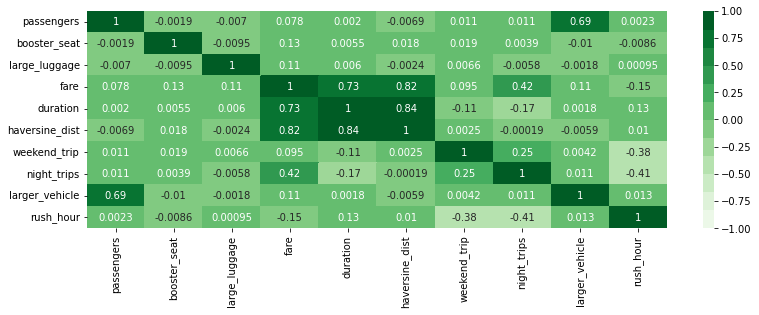

In [82]:
# Correlation and importance of attributes through heatmap

plt.figure(figsize=[13,4])
colormap = sns.color_palette("Greens", 12)
sns.heatmap(train_dataset.corr(), annot=True, vmin=-1, vmax=1, center=0, cmap=colormap)
plt.show();
pass

Through this observation it is observed that distinct separation in value between duration and distances of the same length is impacted by night fares.

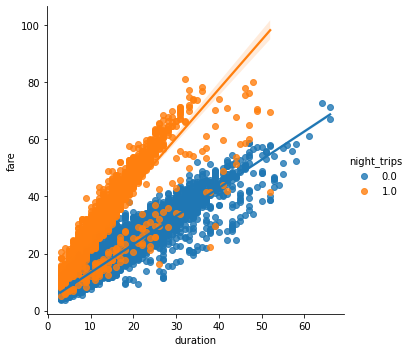

In [83]:
# Night time trips affects the fare over the same distances

sns.lmplot(x="duration", y="fare", data=train_dataset, hue="night_trips");pass

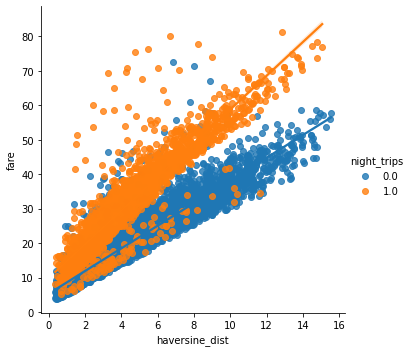

In [84]:
# Night time trips affects the fare over the same distances

sns.lmplot(x="haversine_dist", y="fare", data=train_dataset, hue="night_trips");pass

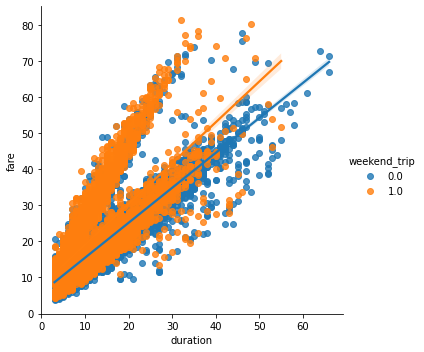

In [85]:
# Finding weekend trips affects the price of the duration

sns.lmplot(x="duration", y="fare", data=train_dataset, hue="weekend_trip");pass

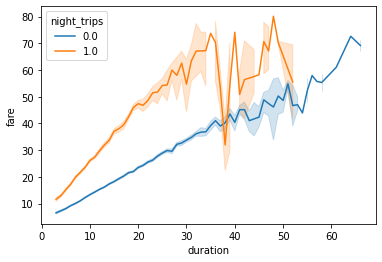

In [86]:
# Another plot to see the difference in duration and fare when taking a taxi at night time.

sns.lineplot(data=train_dataset, x="duration", y="fare", hue="night_trips"); pass

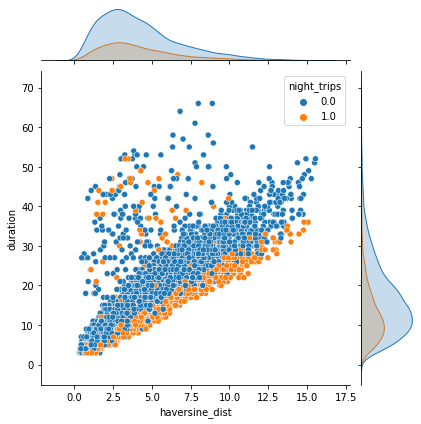

In [87]:
# No correlation found between duration and distance between night time and daytime
# More journeys during the day.

sns.jointplot(data=train_dataset, x="haversine_dist", y="duration", hue="night_trips");pass

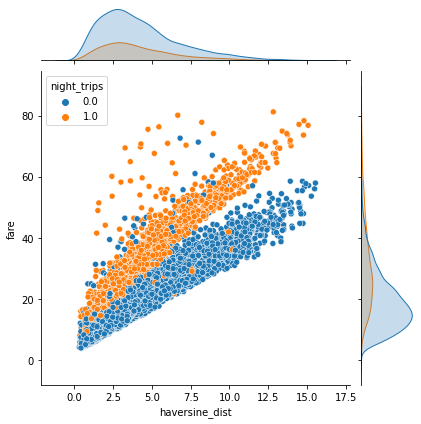

In [88]:
# Investigating the change in distance and fare when at night time and day time.

sns.jointplot(data=train_dataset, x="haversine_dist", y="fare", hue="night_trips");pass

### Cross Validation

In [89]:
from sklearn.model_selection import cross_val_score
# Cross validation is important to identify an possibility of overfitting, it takes our average RMSE.

CV_Score = cross_val_score(chosen_MLP, X, y.values.ravel(), scoring="neg_mean_squared_error", cv=5, n_jobs=1)
RMSE = np.sqrt(-CV_Score)

print("RMSE values: ", np.round(RMSE, 2))
print("RMSE average: ", np.mean(RMSE))

RMSE values:  [2.12 1.92 1.99 2.08 2.02]
RMSE average:  2.0266120540628725


### Graph Evaluation of Models

In [90]:
from yellowbrick.regressor import ResidualsPlot
from yellowbrick.regressor import PredictionError
from yellowbrick.model_selection import DroppingCurve
from yellowbrick.regressor import CooksDistance

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



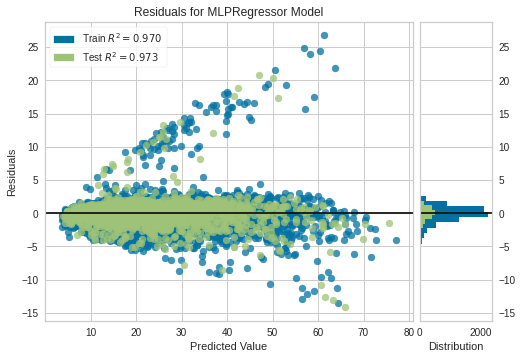

In [91]:
# MLPRegressor Performance Visualisations

X = train_dataset.drop('fare', axis=1)
y = train_dataset['fare']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# You can see the accuracy of the test train values and the test values
visualizer = ResidualsPlot(MLPRegressor())
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
g = visualizer.poof(); pass

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:696: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



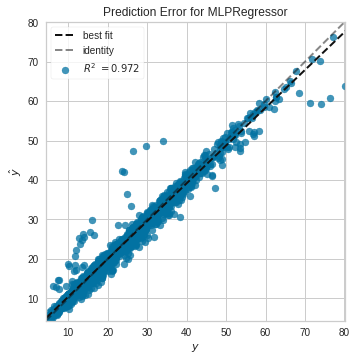

In [92]:
# Prediction error arising from after around fare gets to 30 due to less trips at that price.

visualizer = PredictionError(MLPRegressor())
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
visualizer.poof(); pass

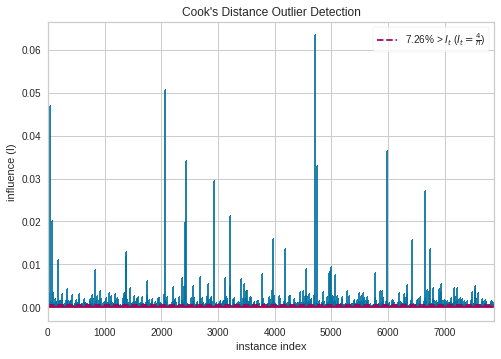

In [93]:
# Which outliers have affected the model and at which iteration for the train data

visualizer = CooksDistance()
visualizer.fit(X_train, y_train)
visualizer.show(); pass

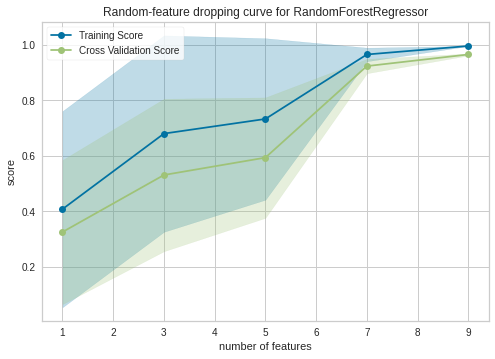

In [94]:
# Random Forest Performance Visualisations
# A positive increase in performance is seen with a positive increase in the number of features

visualizer = DroppingCurve(RandomForestRegressor())
visualizer.fit(X, y)
visualizer.show(); pass

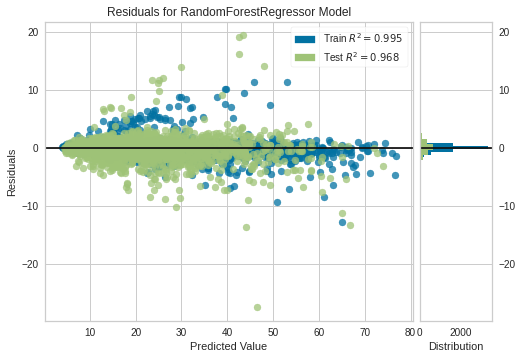

In [95]:
visualizer = ResidualsPlot(RandomForestRegressor())
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
g = visualizer.poof()

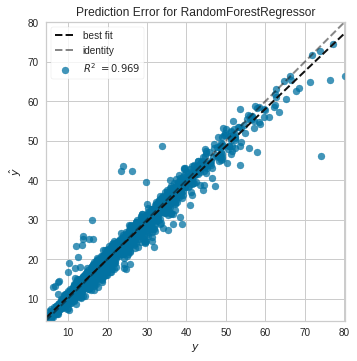

In [96]:
# Similar to before the prediction comes after £30. Probable cause would be less journeys after £30.
# Average journey fare is ~22 pound.

visualizer = PredictionError(RandomForestRegressor())
visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)
g = visualizer.poof()

### Hold out test set

Redesigning the test set to match the train set identically to avoid confusion and errors.

In [97]:
from sklearn.impute import SimpleImputer
hold_out = pd.read_csv('test.csv')

In [98]:
hold_out.head()

,start_time,start_lat,start_lon,orig_addr,end_time,end_lat,end_lon,dest_addr,passengers,booster_seat,large_luggage,fare
0,18/09/2019 09:30,50.733720,-1.786919,"King's Avenue, Christchurch BH23 1JP, UK",18/09/2019 09:48,50.750972,-1.877036,"780 Wimborne Rd, Bournemouth BH9 2DX, UK",1,False,False,NaN
1,11/09/2019 20:14,50.723093,-1.852459,"Lynton Court, Bournemouth BH1 3PF, UK",11/09/2019 20:24,50.751985,-1.891875,"Hendford Road, Bournemouth BH10 4DX, UK",1,False,False,NaN
2,18/09/2019 16:55,50.752449,-1.829006,"Townsend School, Bournemouth BH8 0LQ, UK",18/09/2019 17:23,50.800657,-1.983474,"Police Station, Wimborne Minster, Wimborne BH2...",1,False,False,NaN
3,21/09/2019 03:02,50.720738,-1.905065,"Alumhurst Day Centre, Bournemouth BH4 8EL, UK",21/09/2019 03:09,50.752643,-1.904277,"Columbia Road, Bournemouth BH10 4DR, UK",1,False,False,NaN
4,22/09/2019 00:53,50.723291,-1.903756,"Westbourne Court, 92-96 Poole Rd, Bournemouth ...",22/09/2019 01:01,50.750019,-1.918883,"Evans Close, Bournemouth BH11 8RE, UK",1,False,False,NaN


In [99]:
hold_out.isnull().sum()

start_time          0
start_lat          29
start_lon          29
orig_addr           0
end_time            0
end_lat            23
end_lon            23
dest_addr           0
passengers          0
booster_seat        0
large_luggage       0
fare             1449
dtype: int64

#### Handling the Hold out missing values

In [100]:
hold_out['orig_postcode'] = hold_out.apply(lambda hold_out: postcode(hold_out['orig_addr']), axis = 1)
hold_out['dest_postcode'] = hold_out.apply(lambda hold_out: postcode(hold_out['dest_addr']), axis = 1)

In [101]:
hold_out['start_lat'] = hold_out.apply(lambda hold_out: fill_coord_lat(hold_out['orig_postcode'])[0] 
                                       if pd.isnull(hold_out['start_lat']) 
                                       else hold_out['start_lat'], axis = 1)

hold_out['start_lon'] = hold_out.apply(lambda hold_out: fill_coord_lon(hold_out['orig_postcode'])[0] 
                                       if pd.isnull(hold_out['start_lon']) 
                                       else hold_out['start_lon'], axis = 1)

In [102]:
hold_out['end_lat'] = hold_out.apply(lambda hold_out: fill_coord_lat(hold_out['dest_postcode'])[0] 
                                     if pd.isnull(hold_out['end_lat']) 
                                     else hold_out['end_lat'], axis = 1)

hold_out['end_lon'] = hold_out.apply(lambda hold_out: fill_coord_lon(hold_out['dest_postcode'])[0] 
                                     if pd.isnull(hold_out['end_lon']) 
                                     else hold_out['end_lon'], axis = 1)

In [103]:
hold_out.isnull().sum()

start_time          0
start_lat           0
start_lon           0
orig_addr           0
end_time            0
end_lat             0
end_lon             0
dest_addr           0
passengers          0
booster_seat        0
large_luggage       0
fare             1449
orig_postcode       0
dest_postcode       0
dtype: int64

#### Feature Engineering for the Hold out test
##### **Reassigning the attributes to hold out for the test.csv file**

It is important to make sure both the train dataset and test dataset match up, including all the same data types and attribute names, to prevent any mismatch when the predictive model tries to perform on the test data.

In [104]:
hold_out = hold_out.drop(['orig_addr', 'dest_addr', 'orig_postcode', 'dest_postcode', 'fare'], axis=1)

In [105]:
hold_out['start_time'] = pd.to_datetime(hold_out['start_time'],format='%d/%m/%Y %H:%M')
hold_out['end_time'] = pd.to_datetime(hold_out['end_time'],format='%d/%m/%Y %H:%M')

In [106]:
hold_out.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1449 entries, 0 to 1448
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   start_time     1449 non-null   datetime64[ns]
 1   start_lat      1449 non-null   float64       
 2   start_lon      1449 non-null   float64       
 3   end_time       1449 non-null   datetime64[ns]
 4   end_lat        1449 non-null   float64       
 5   end_lon        1449 non-null   float64       
 6   passengers     1449 non-null   int64         
 7   booster_seat   1449 non-null   bool          
 8   large_luggage  1449 non-null   bool          
dtypes: bool(2), datetime64[ns](2), float64(4), int64(1)
memory usage: 82.2 KB


In [107]:
hold_out.head()

,start_time,start_lat,start_lon,end_time,end_lat,end_lon,passengers,booster_seat,large_luggage
0,2019-09-18 09:30:00,50.733720,-1.786919,2019-09-18 09:48:00,50.750972,-1.877036,1,False,False
1,2019-09-11 20:14:00,50.723093,-1.852459,2019-09-11 20:24:00,50.751985,-1.891875,1,False,False
2,2019-09-18 16:55:00,50.752449,-1.829006,2019-09-18 17:23:00,50.800657,-1.983474,1,False,False
3,2019-09-21 03:02:00,50.720738,-1.905065,2019-09-21 03:09:00,50.752643,-1.904277,1,False,False
4,2019-09-22 00:53:00,50.723291,-1.903756,2019-09-22 01:01:00,50.750019,-1.918883,1,False,False


In [108]:
hold_out.booster_seat = hold_out.booster_seat.replace({True: 1, False: 0}).astype(float)
hold_out.large_luggage = hold_out.large_luggage.replace({True: 1, False: 0}).astype(float)
hold_out.passengers = hold_out.passengers.astype(float)

**Hold out duration calculation**

In [109]:
hold_out['duration'] = (hold_out['end_time'] - hold_out['start_time']).dt.total_seconds() / 60 

**Hold out distance calculation**

**Google Maps API Distance Calculation**

In [110]:
# hold_out["start_lat"] = hold_out["start_lat"].astype(str)
# hold_out["start_lon"] = hold_out["start_lon"].astype(str)
# hold_out["origins"] = hold_out["start_lat"] + "," + hold_out["start_lon"]

In [111]:
# hold_out["end_lat"] = hold_out["end_lat"].astype(str)
# hold_out["end_lon"] = hold_out["end_lon"].astype(str)
# hold_out["destinations"] = hold_out["end_lat"] + "," + hold_out["end_lon"]

In [112]:
# hold_out["google_distance"] = hold_out.apply(get_distances, axis=1)

In [113]:
# hold_out["google_distance"] = hold_out["google_distance"].astype(float)

In [114]:
# hold_out = hold_out.drop(['origins', 'destinations'], axis=1)

**Haversine Distance Calculation**

In [115]:
haversine_dist = hold_out.apply(lambda row : haversine_distance(row['end_lat'], 
                                                                row['end_lon'], 
                                                                row['start_lat'], 
                                                                row['start_lon']), axis = 1)
hold_out['haversine_dist'] = haversine_dist

In [116]:
hold_out.head()

,start_time,start_lat,start_lon,end_time,end_lat,end_lon,passengers,booster_seat,large_luggage,duration,haversine_dist
0,2019-09-18 09:30:00,50.733720,-1.786919,2019-09-18 09:48:00,50.750972,-1.877036,1.0,0.0,0.0,18.0,4.117709
1,2019-09-11 20:14:00,50.723093,-1.852459,2019-09-11 20:24:00,50.751985,-1.891875,1.0,0.0,0.0,10.0,2.638077
2,2019-09-18 16:55:00,50.752449,-1.829006,2019-09-18 17:23:00,50.800657,-1.983474,1.0,0.0,0.0,28.0,7.528141
3,2019-09-21 03:02:00,50.720738,-1.905065,2019-09-21 03:09:00,50.752643,-1.904277,1.0,0.0,0.0,7.0,2.205334
4,2019-09-22 00:53:00,50.723291,-1.903756,2019-09-22 01:01:00,50.750019,-1.918883,1.0,0.0,0.0,8.0,1.962207


**Hold out weekend trips attribute insertion**

In [117]:
hold_out['weekend_trip'] = hold_out.apply(lambda hold_out: day_of_trip(hold_out['start_time'].day_name()), axis = 1)
hold_out.weekend_trip = hold_out.weekend_trip.replace({"Weekend": 1, "Weekday": 0}).astype(float)

**Hold out night journeys attribute insertion**

In [118]:
hold_out['night_trips'] = hold_out.apply(lambda hold_out: time_of_trip(hold_out['start_time'].hour), axis = 1)
hold_out.night_trips = hold_out.night_trips.replace({"Night Tarriff": 1, "Day Tarriff": 0}).astype(float)

**Hold out busiest days attribute insertion**

In [119]:
hold_out['busy_days'] = hold_out.apply(lambda hold_out: busiest_days(hold_out['start_time'].day_name()), axis = 1)
hold_out.busy_days = hold_out.busy_days.replace({"Busy Day": 1, "Slower Day": 0}).astype(float)

**Hold out larger vehicle attribute insertion**

In [120]:
hold_out['larger_vehicle'] = hold_out.apply(lambda hold_out: larger_car_trip(hold_out['passengers']), axis = 1)
hold_out.larger_vehicle = hold_out.larger_vehicle.replace({"Larger Vehicle": 1, "Basic Vehicle": 0}).astype(float)

**Hold out holiday attribute insertion**

In [121]:
str(hold_out['start_time'][0]).split()[0]

'2019-09-18'

In [122]:
hold_out['holiday_dates'] = [1 if str(val).split()[0] in uk_holidays else 0 for val in hold_out['start_time']]
hold_out.holiday_dates = hold_out.holiday_dates.astype(float)

**Hold out rush hour attribute insertion**

In [123]:
hold_out['rush_hour'] = hold_out.apply(lambda hold_out: rush_hour_times(hold_out['start_time'].hour), axis = 1)
hold_out.rush_hour = hold_out.rush_hour.replace({"Rush Hour": 1, "Normal": 0}).astype(float)

**Dropping the redundant attributes of our hold out test set**

In [124]:
hold_out = hold_out.drop(['start_time', 'start_lat', 'start_lon', 'end_time', 'end_lat', 'end_lon'], axis=1)

**Dropping the features to match the testing of the train dataset**

In [125]:
hold_out = hold_out.drop(['holiday_dates', 'busy_days'], axis=1)
hold_out.head()

,passengers,booster_seat,large_luggage,duration,haversine_dist,weekend_trip,night_trips,larger_vehicle,rush_hour
0,1.0,0.0,0.0,18.0,4.117709,0.0,0.0,0.0,1.0
1,1.0,0.0,0.0,10.0,2.638077,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,28.0,7.528141,0.0,0.0,0.0,1.0
3,1.0,0.0,0.0,7.0,2.205334,1.0,1.0,0.0,0.0
4,1.0,0.0,0.0,8.0,1.962207,1.0,1.0,0.0,0.0


#### Error Analysis
The importance for error analysis is crucial in making sure there are no outliers remaining that could throw off or upset the results of the model.

In [126]:
print("Train Dataset")
print("Max Distance: ", train_dataset["haversine_dist"].max())
print("Max Duration: ", train_dataset["duration"].max())
print(" ")

print("Hold out Dataset")
print("Max Distance: ", hold_out["haversine_dist"].max())
print("Max Duration: ", hold_out["duration"].max())

Train Dataset
Max Distance:  15.537711816107045
Max Duration:  66.0
 
Hold out Dataset
Max Distance:  15.492022735667511
Max Duration:  69.0


In [127]:
print("Train Dataset")
print("Min Distance: ", train_dataset["haversine_dist"].min())
print("Min Duration: ", train_dataset["duration"].min())
print("Count of Minimum Duration: ", train_dataset["duration"].value_counts().min())
print(" ")

print("Hold out Dataset")
print("Min Distance: ", hold_out["haversine_dist"].min())
print("Min Duration: ", hold_out["duration"].min())
print("Count of Minimum Duration: ", hold_out["duration"].value_counts().min())

Train Dataset
Min Distance:  0.3228095695593568
Min Duration:  3.0
Count of Minimum Duration:  1
 
Hold out Dataset
Min Distance:  0.32318694566293005
Min Duration:  0.0
Count of Minimum Duration:  1


In [128]:
# Seems as though the outliers seem to start at a duration of 49 minutes

fig = px.box(hold_out, y='duration', width=800, height=400)
fig.show()

#### Simple Imputation
##### Using Simple Imputer to fill missing values

Originally, a simple imputer was used to fill the missing values of the dataset, but it was found that using geocode to replace the missing longitude and latitude worked better and gave back more accurate results.

In [129]:
#imp = SimpleImputer(missing_values=np.nan, strategy='mean')
#imp.fit(hold_out)
#temp = imp.transform(hold_out)
#hold_out = pd.DataFrame(data=temp, columns=list(hold_out.columns))

#### Final check of the input into the test.csv file

Finally, it is made sure that the dataset of the test.csv file is identical to the train.csv to ensure the model can predict correctly using all the features.

In [130]:
hold_out.head(5)

,passengers,booster_seat,large_luggage,duration,haversine_dist,weekend_trip,night_trips,larger_vehicle,rush_hour
0,1.0,0.0,0.0,18.0,4.117709,0.0,0.0,0.0,1.0
1,1.0,0.0,0.0,10.0,2.638077,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,28.0,7.528141,0.0,0.0,0.0,1.0
3,1.0,0.0,0.0,7.0,2.205334,1.0,1.0,0.0,0.0
4,1.0,0.0,0.0,8.0,1.962207,1.0,1.0,0.0,0.0


In [131]:
hold_out.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1449 entries, 0 to 1448
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   passengers      1449 non-null   float64
 1   booster_seat    1449 non-null   float64
 2   large_luggage   1449 non-null   float64
 3   duration        1449 non-null   float64
 4   haversine_dist  1449 non-null   float64
 5   weekend_trip    1449 non-null   float64
 6   night_trips     1449 non-null   float64
 7   larger_vehicle  1449 non-null   float64
 8   rush_hour       1449 non-null   float64
dtypes: float64(9)
memory usage: 102.0 KB


The insertion of the chosen regression algorithm is then applied here.

In [132]:
hold_out_pred = chosen_MLP.predict(hold_out).flatten()

In [133]:
hold_out_pred.max()

79.98431959862076

In [134]:
RowID = np.array(hold_out.index)+1

## Results of our test CSV

In [135]:
results = pd.DataFrame({'RowId':RowID, 'fare':hold_out_pred})
results[:10]

,RowId,fare
0,1,18.408314
1,2,12.137620
2,3,29.854946
3,4,18.363593
4,5,18.778501
5,6,22.148906
6,7,9.950939
7,8,15.236208
8,9,13.536905
9,10,22.331274


In [136]:
results.to_csv('results.csv', index=False)

In [137]:
# Submission to Kaggle BUDM22 Leaderboard

#!kaggle competitions submit -c budm22 -f results.csv -m 'INSERT DESCRIPTION HERE.'